In [1]:
!pip install transformers[torch]==4.19.2 shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 24.7 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.15.1
    Uninstalling tokenizers-0.15.1:
      Successfully uninstalled tokenizers-0.15.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.2
    Uninstalling transformers-4.35.2:
      Successfully uninstalled transformers-4.35.2


In [2]:
import numpy as np
import shap
import torch
import torch.nn.functional as F
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification
import pandas as pd
from tqdm import tqdm
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device available: ",device)
seed = 42
np.random.seed(seed)

Device available:  cuda


In [3]:
# Trained Model
distilbert_model_path = '/content/drive/MyDrive/NLP_LSS/distinctiveness_indicator/distilbert/model/distilbert_unprocessed_v1.pth'
# Input Data
data_path = '/content/drive/MyDrive/NLP_LSS/distinctiveness_indicator/distilbert/data/df_distilbert_input_unprocessed.pkl'
# DistilBERT Tokenizer
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-cased')
# Temperature
TEMP = 0.75

model = torch.load(distilbert_model_path)
class_names = ['not distinct','distinct']

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/465 [00:00<?, ?B/s]

In [4]:
# Function to generate batches and reshape
def batching(np_array, max_idx, batch_size):
    np_array = np_array[:max_idx]
    np_array = np_array.reshape(-1, batch_size)
    batched_list = np_array.tolist()
    return batched_list

In [5]:
# Temperature Scaling
def T_scaling(logits, args):
    temperature = args.get('temperature', None)
    return torch.div(logits, temperature)

In [6]:
# Predictor function for SHAP - takes list of strings as input
def predictor_shap(text_list):
    X = batching(np.array(text_list), max_idx=len(text_list), batch_size=1)
    pred_prob = []
    pred_logits = []
    model.eval()
    with torch.no_grad():
        for text in tqdm(X, total=len(X)):
            model_inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)
            model_inputs = {k:v.to(device) for k,v in model_inputs.items()}
            output = model(**model_inputs)
            logits = output[0]
            logits = T_scaling(logits, {'temperature':TEMP})
            probs = torch.sigmoid(logits)
            pred_prob.extend(probs[:,1].tolist())
    return pred_prob

In [7]:
def preprocess(input_text):
  text = input_text.replace("[SEP]", "\n")
  text = text.replace("[CLS]", "")
  return text

In [8]:
## Function to get word level scores from SHAP

def get_word_level_scores(shap_values, text, idx=0):
  # Strip text
  text = text.strip()
  # Split text
  text_split = text.split()
  # Will have word level scores
  word_level_scores = []
  # Subwords and corresponding scores from SHAP
  subwords = shap_values.data[idx]
  subword_scores = shap_values.values[idx]
  nsubwords = shap_values.data[idx].shape[0]
  # Iterator for word in text
  word_counter = 0
  # Initialize current subword, number of subwords needed to make a word and word score
  curr_subword = ''
  nsub = 0
  word_score = 0
  for i in range(nsubwords):
    # Don't consider empty string
    if subwords[i]==' ':
      continue
    # If subword matches current text word, append to list
    if curr_subword.strip() == text_split[word_counter].strip():
      word_level_scores.append((text_split[word_counter], word_score/nsub))
      word_counter += 1
      nsub = 0
      curr_subword = ''
      word_score = 0
    # Concatenate subwords
    curr_subword += subwords[i]
    word_score += subword_scores[i]
    nsub += 1

  assert(len(word_level_scores)==len(text_split))
  return word_level_scores

In [123]:
from IPython.display import HTML

def highlight_words(wordlevel_scores):
  words = [x[0] for x in wordlevel_scores]
  scores = [x[1] for x in wordlevel_scores]
  maxscore = max(scores)
  minscore = min(scores)
  normscores = [(x-minscore)/(maxscore-minscore) for x in scores]

  # Create HTML content with words highlighted based on numeric values
  html_content = "<p>"
  for word, value in zip(words, normscores):
      color = f"rgba(0, {int(255 * value)}, 0, 0.5)"
      html_content += f'<span style="background-color: {color};">{word} </span>'
  html_content += "</p>"

  # Explanation for colors and colormap legend
  explanation = "<p>Explanation for colors:</p>"
  explanation += "<ul>"
  explanation += "<li>Words with high numeric values have a color closer to green.</li>"
  explanation += "</ul>"

  # Display the HTML content, explanation, and colormap legend in the notebook
  display(HTML(explanation))
  display(HTML(html_content))


In [124]:
import matplotlib.patches as mpatches
import seaborn as sns
def plot_bar(wordlevel_scores, topk=3):
  sns.set_theme()
  sorted_scores = sorted(wordlevel_scores, key=lambda tup: tup[1], reverse=True)

  # Get scores
  scores = [x[1] for x in sorted_scores]

  # Select top-k and bottom-k words
  topk_scores = scores[:topk]
  bottomk_scores = scores[-topk:]
  all_scores = topk_scores + bottomk_scores

  # Top-k and Bottom-k words
  topk_words = [x[0] for x in sorted_scores[:topk]]
  bottomk_words = [x[0] for x in sorted_scores[-topk:]]
  all_words = topk_words + bottomk_words
  groups = ['Bottom{k}'.format(k=topk)]*topk + ['Top{k}'.format(k=topk)]*topk

  # Create a dictionary to map unique groups to colors
  unique_groups = sorted(set(groups))
  color_map = {group: plt.cm.viridis(i / len(unique_groups)) for i, group in enumerate(unique_groups)}

  # Map each group to a color
  colors = [color_map[group] for group in groups]

  # Create a horizontal bar plot
  fig, ax = plt.subplots()
  bars = ax.barh(list(reversed(all_words)), list(reversed(all_scores)), color=colors)

  # Add labels and title
  ax.set_xlabel('Attribution to distinctiveness')
  ax.set_ylabel('Words')
  ax.set_title('Word-Level SHAP attributions')

  # Add a color legend
  legend_handles = [plt.Rectangle((0, 0), 1, 1, color=color_map[group], label=group) for group in unique_groups]
  ax.legend(handles=legend_handles, labels=unique_groups, loc='lower right')

  # Show the plot
  plt.show()



  # y_pos = np.arange(len(all_words))
  # # Bar plot - TopK
  # plt.barh(y_pos, list(reversed(all_scores)), align='center')
  # plt.yticks(y_pos, list(reversed(all_words)))
  # plt.xlabel('Top {k} Word Level Attribution'.format(k=topk))
  # plt.axhline(y = 2.5, color = 'grey', linestyle = '--')
  # plt.show()
  # print("\n\n\n")


### Watermelon Example

In [9]:
wm_computer = """
WATERMELON. Computer hardware; computer hardware, namely, server, desktop, laptop and notebook computers;
"""
wm_fruit = """
WATERMELON. Retail stores featuring fruit, wholesale distributorships featuring fruit,
wholesale ordering services in the field of fruit.
"""
wm_anagram = """
EMERLWONAT. Retail stores featuring fruit, wholesale distributorships featuring fruit,
wholesale ordering services in the field of fruit.
"""

#### Computer

In [10]:
%%capture
shap_explainer = shap.Explainer(predictor_shap, tokenizer, silent=True)
shap_values = shap_explainer([wm_computer], silent=True)

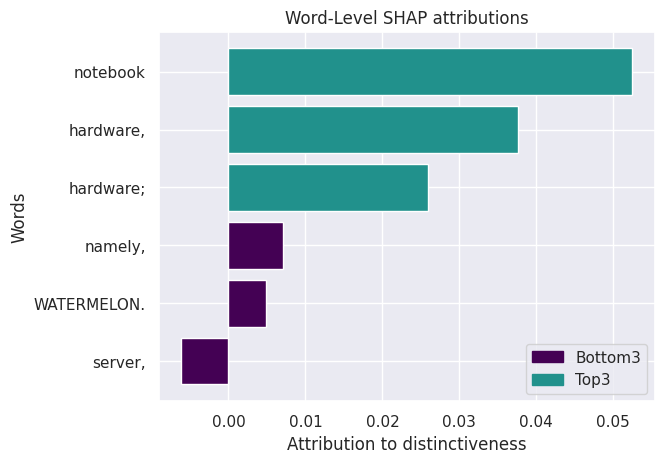

In [147]:
wordlevel_scores = get_word_level_scores(shap_values, wm_computer)
highlight_words(wordlevel_scores)
plot_bar(wordlevel_scores)

#### Fruit

In [148]:
%%capture
shap_values = shap_explainer([wm_fruit], silent=True)

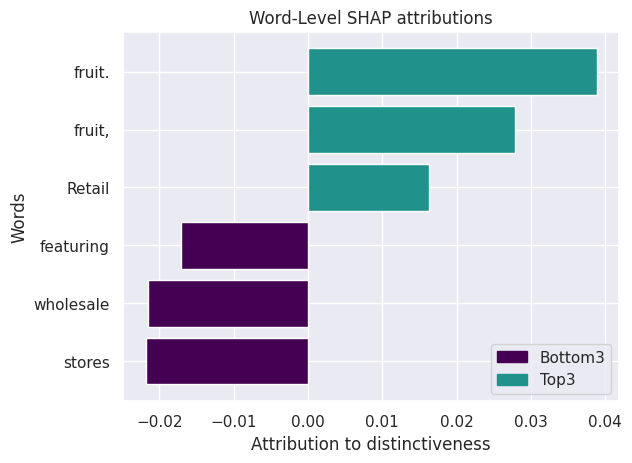

In [149]:
wordlevel_scores = get_word_level_scores(shap_values, wm_fruit)
highlight_words(wordlevel_scores)
plot_bar(wordlevel_scores)

In [136]:
wordlevel_scores

[('WATERMELON.', 0.09011955559253693),
 ('Retail', 0.03249480538070202),
 ('stores', -0.02184286864163975),
 ('featuring', -0.01704368704619507),
 ('fruit,', 0.055619666011383136),
 ('wholesale', -0.0014115155984958014),
 ('distributorships', 0.015923391406734783),
 ('featuring', 0.0019809318085511527),
 ('fruit,', 0.013864404211441677),
 ('wholesale', -0.02153918892145157),
 ('ordering', -0.00608181394636631),
 ('services', -0.0001584719866514206),
 ('in', 0.01250973716378212),
 ('the', 0.008800378395244479),
 ('field', 0.0027042998466640707),
 ('of', 0.0007818267680704593),
 ('fruit.', 0.0776530929841101)]

#### Anagram

In [150]:
%%capture
shap_values = shap_explainer([wm_anagram], silent=True)


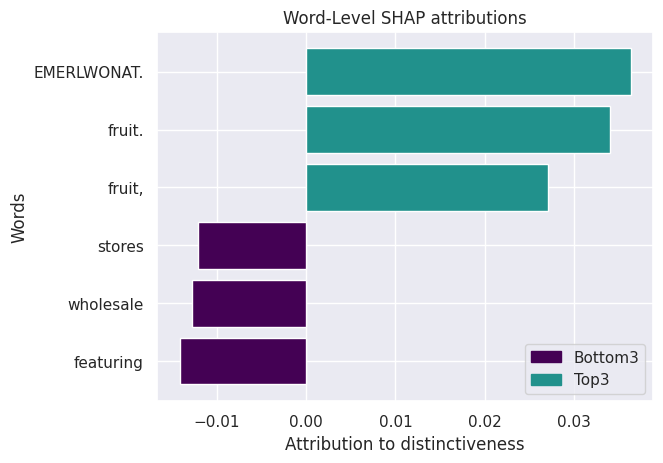

In [151]:
wordlevel_scores = get_word_level_scores(shap_values, wm_anagram)
highlight_words(wordlevel_scores)
plot_bar(wordlevel_scores)

#### Made up word

In [152]:
madeup_word = """
XADERMAC. Retail stores featuring fruit, wholesale distributorships featuring fruit,
wholesale ordering services in the field of fruit.
"""

In [153]:
%%capture
shap_values = shap_explainer([madeup_word], silent=True)


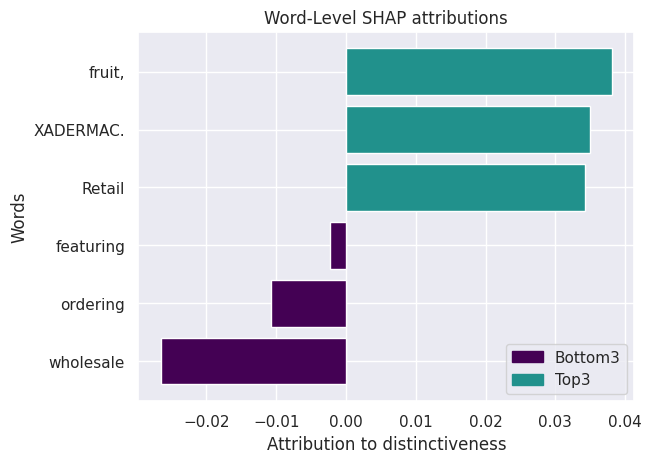

In [154]:
wordlevel_scores = get_word_level_scores(shap_values, madeup_word)
highlight_words(wordlevel_scores)
plot_bar(wordlevel_scores)

### ZIPSCENE

In [155]:
zipscene_text = """
ZIPSCENE. Marketing and market research services; Analyzing and compiling business and marketing data,
namely, data assembly, integrations, and analysis relating to customer behavior and transactions;
Customer relationship consultation, namely, developing strategies and programs for
communicating with customers. no translation required. mark absent in Wordnet. mark length is 1.
NICE category is 35. Advertising;
Business management, organization and administration; Office function.s Pseudo mark is ZIP SCENE
"""


In [156]:
%%capture
shap_values = shap_explainer([zipscene_text], silent=True)


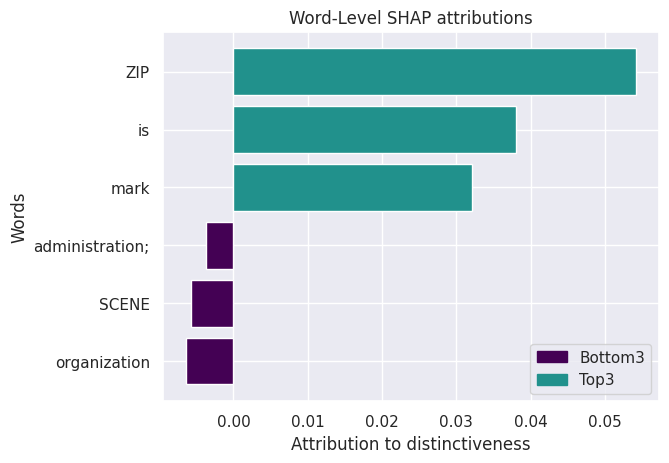

In [157]:
wordlevel_scores = get_word_level_scores(shap_values, zipscene_text)
highlight_words(wordlevel_scores)
plot_bar(wordlevel_scores)

#### BERTViz

In [11]:
!pip install bertviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 90.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.7 MB/s eta 0:00:00


In [12]:
from transformers import utils
from bertviz import model_view
utils.logging.set_verbosity_error()  # Suppress standard warnings


In [13]:
def generate_viz(input_text):
  inputs = tokenizer(input_text, return_tensors='pt').to(device)
  print(len(inputs[0]))
  out = model(**inputs, output_attentions=True)
  attention = out['attentions']  # Retrieve attention from model outputs
  attention
  tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])  # Convert input ids to token strings
  model_view(attention, tokens)  # Display model view
  return attention

### Computer

In [22]:
attention = generate_viz(wm_computer)

26


<IPython.core.display.Javascript object>

In [23]:
attention[0].shape
# 12 heads, 26 tokens

torch.Size([1, 12, 26, 26])

In [24]:
attn_watermelon = attention[0][0,9,:,:][:,1:6]
avg_attention = attn_watermelon.sum()/26
avg_attention

tensor(0.1290, device='cuda:0', grad_fn=<DivBackward0>)

### Fruit

In [25]:
attention = generate_viz(wm_fruit)

30


<IPython.core.display.Javascript object>

In [26]:
attn_watermelon = attention[0][0,9,:,:][:,1:6]
avg_attention = attn_watermelon.sum()/30
avg_attention

tensor(0.1082, device='cuda:0', grad_fn=<DivBackward0>)

### Anagram

In [27]:
attention = generate_viz(wm_anagram)

30


<IPython.core.display.Javascript object>

In [28]:
attn_watermelon = attention[0][0,9,:,:][:,1:6]
avg_attention = attn_watermelon.sum()/30
avg_attention

tensor(0.1207, device='cuda:0', grad_fn=<DivBackward0>)

### Made Up

In [86]:
generate_viz(madeup_word)

<IPython.core.display.Javascript object>